# SPRING FLOD ANALYSIS

1. Click box below and choose sheet in excel that you want to do an analysis for.
2. Click on Cell -> Run All

In [1]:
#Choosing LTM model
# Norg, Sver, LTM1,..LTM8, LTMS
sheet = 'LTM5'

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
if (code_show){
$('div.input').hide();
} else {
$('div.input').show();
}
code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')



In [3]:
import sys

path = '\\\\energycorp\\applications\\OSL\\jupyter_notebooks\\personalfolders\\u39545_Sarah\\EtteranalyseLTM'
sys.path.insert(0, path)

import modules as m

%load_ext autoreload
%autoreload 2

print('\n------------------------------------------------------------------------------------------------------\n')
print('                                                  {}                                                '.format(sheet))
print('\n------------------------------------------------------------------------------------------------------\n')
file = r'spring_flod_analysis.xlsx'

#Reading comments etc from Excel file: 'Etteranalyse_snow_LTM.xlsx'
all_keys, vhhQ_OBSE_list, comments_list, excluded_list, start_list, end_list = m.read_excel(sheet, file)
    
#Reading in all keys from SMG
all_df = m.read_from_SMG(all_keys, vhhQ_OBSE_list, sheet)

#Making new df for all models for analyis period
df_analysis_period, start_info_list, end_info_list = m.df_analysis_period(all_df, start_list, end_list, sheet)

#Excluding columns that are chosen to be excluded in the Excel document
df_for_analysis, keys_for_analysis = m.exclude_keys(df_analysis_period, all_keys, excluded_list)

#Calculating performance of the models
acc_perf_all, R2_perf_all = m.calc_performance(df_for_analysis, keys_for_analysis)



if sheet == 'Norg':
    acc_perf = acc_perf_all.drop('Norge')
elif sheet == 'Sver':
    acc_perf = acc_perf_all.drop('Sverige')
else:
    acc_perf = acc_perf_all
    
m.summary_table(df_analysis_period, all_keys, sheet)




------------------------------------------------------------------------------------------------------

                                                  LTM5                                                

------------------------------------------------------------------------------------------------------




,Q_OBSE,REF,spring_temp,TEMP,LTM,NORMAL
Aura-109.033,803.9,191.4,150.6,44.4,104.2,9
Gråsjø-112.014,1.3,0.2,0.6,0.6,0.2,0.6
Hugdal-122.017,202.3,-9.2,-9.2,-9.2,-8.1,7.3
Høggås-124.002,284.2,75.6,75.6,18.8,10.6,42.6
Lillebu-122.014,101.2,1.8,1.8,1.8,-5.4,-6.8
Nea-123.998,592.8,-19.4,-19.4,-19.4,9.2,-29.7
Selb.lo-123.020,939.4,1.2,1.2,1.2,72.3,-62.5
Svorka-112.021,43.4,28.2,28.2,28.2,13.2,25.6
Trollhe-112.015,947.3,42.9,95.5,54.3,41.9,-164.9
Tya-123.999,377.1,-70,-23.6,-23.6,-27,-64.8


## BOX AND WHISKER PLOT ACCUMULATIVE DEVIATION FROM Q_OBSE

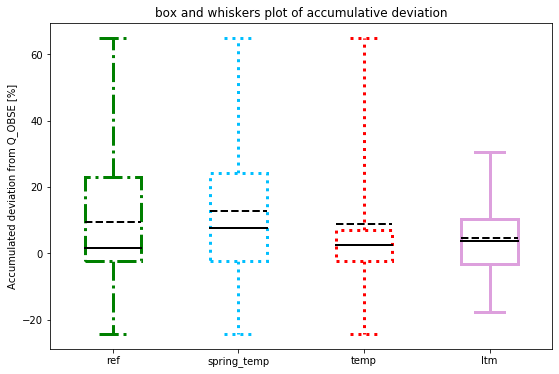

In [4]:
m.box_plot(acc_perf)

# Performance According to Accumulated Deviation from Q_OBSE
## ADJUSTMENTS: BETTER or WORSE

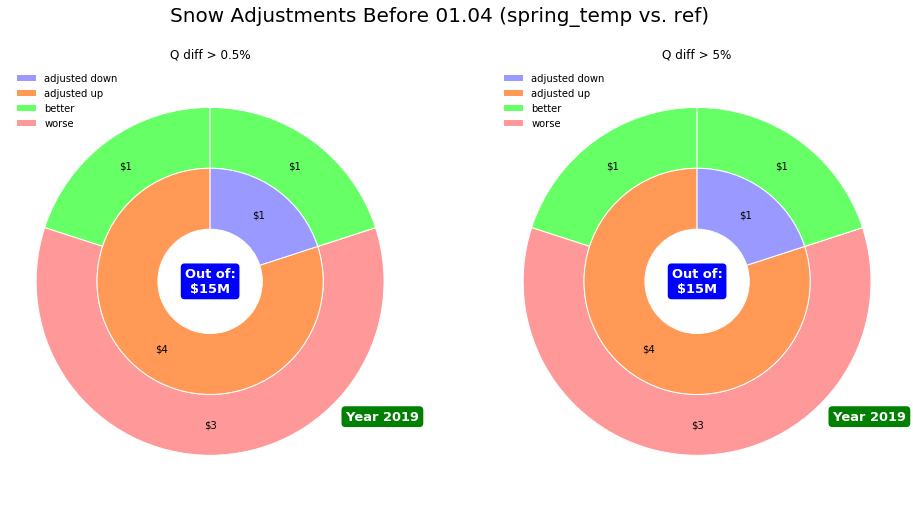

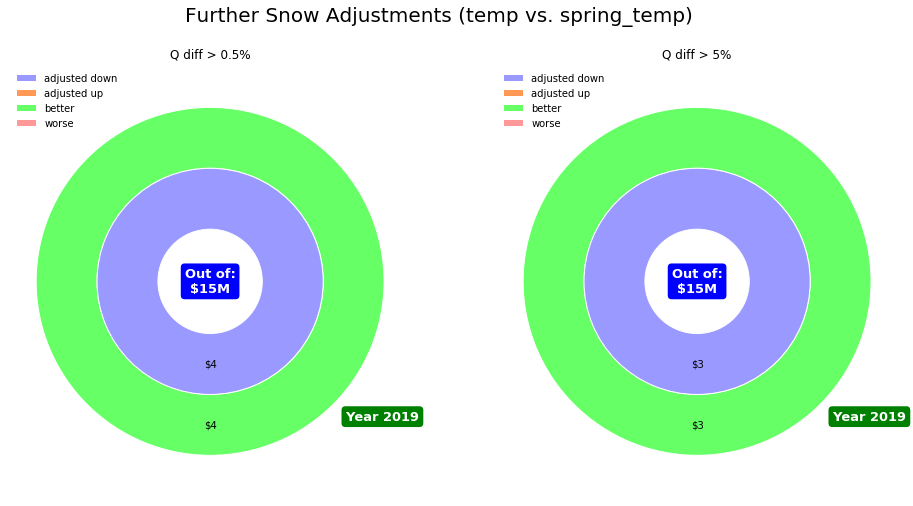

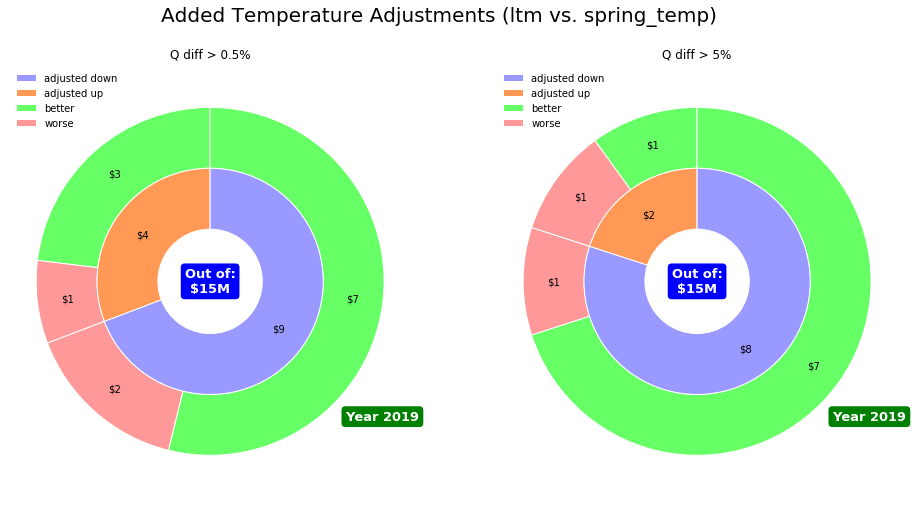

In [5]:
# Macke pie plot with performance for adjusted models
m.pie_subplot_perf(acc_perf, sheet, 'ref', 'spring_temp')
m.pie_subplot_perf(acc_perf, sheet, 'spring_temp', 'temp')
m.pie_subplot_perf(acc_perf, sheet, 'spring_temp', 'ltm')
#m.pie_subplot_perf(acc_perf_df, ltm, what='snow')


# Performance According to Accumulated Inflow [%] Error and Inflow Profile Correlation (R2) 

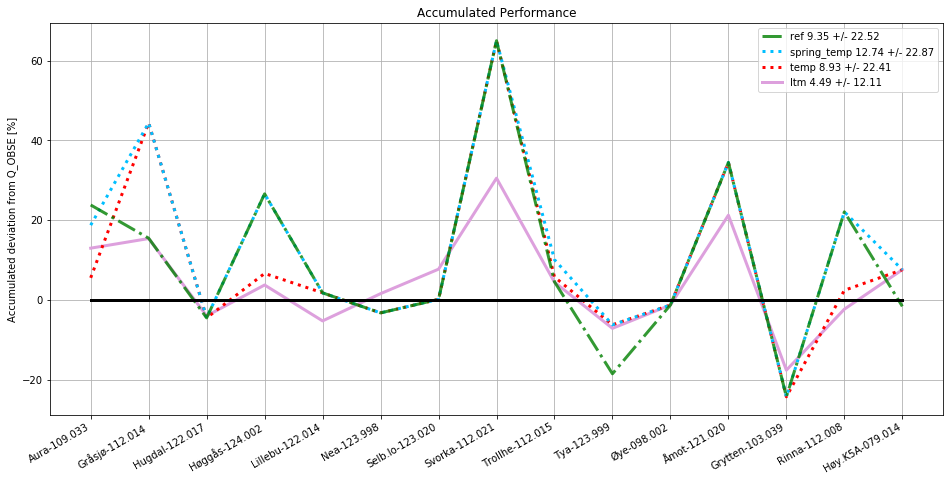

In [6]:
#plot performance for models in the LTM model
m.plot_perf_models(acc_perf_all, sheet, perfType='Accumulated')


# Induvidual Analysis for Each Model

{'u09': 'aquamarine', 'u10': 'moccasin', 'u12': 'pink', 'u16': 'powderblue', 'u22': 'palegreen', 'u24': 'violet', 'u25': 'coral', 'u26': 'khaki'}



------------------------------------------------------------------------------------------------------------------------
                                                        Aura-109.033
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-04): Day befor spring snow adjustment.
WARNING, end after last day! Analysis end (2019-08-25): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Comment from Excel file: "Gav veldig lave vannvedier tidlig på vinteren. For mye snø"


Accumulated performance [percentage deviation]: ref: 23.80, spring_temp: 18.73, temp: 5.52, ltm: 12.97
Profile correlation performance [R2 value]: ref: 0.72, spring_temp: 0.75, temp: 0.85, ltm: 0.92


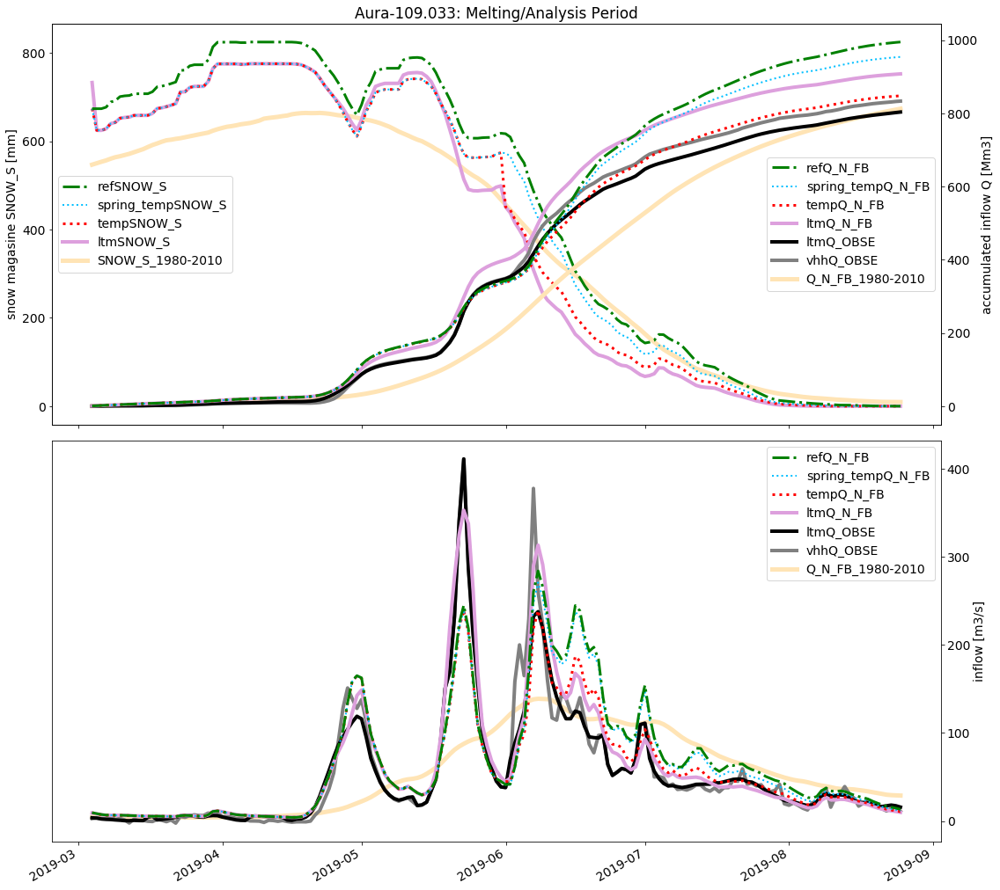

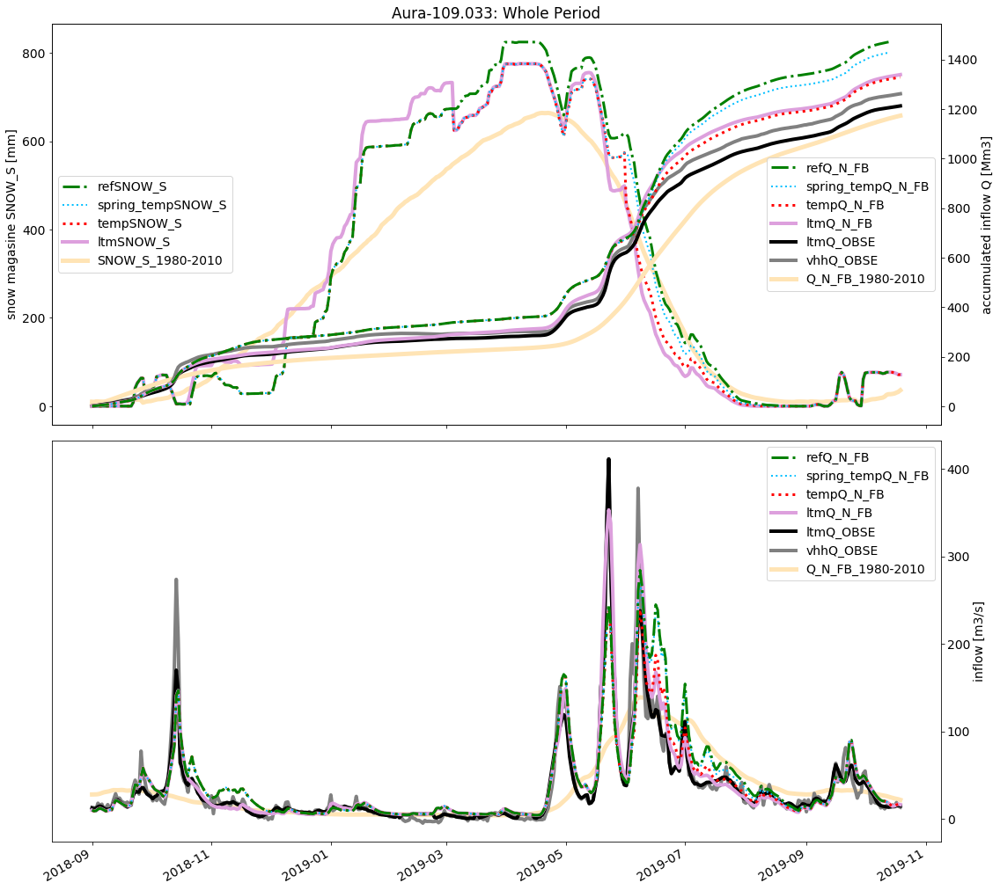




------------------------------------------------------------------------------------------------------------------------
                                                        Gråsjø-112.014
------------------------------------------------------------------------------------------------------------------------
Analysis start (2018-09-21): Day befor spring snow adjustment.
WARNING, end after last day! Analysis end (2018-09-21): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Comment from Excel file: "For mye snø (hele møre, bortsett fra de lavereliggende feltene). På trollheim/gråsjø i år (2019) ble snømagasinet justert drastisk ned rundt juni tider fordi modellen hadde alt for mye snø, og smelta da snø som ikke fantes lenger. Dette ble seende veldig fint ut, og vannverdien økte veldig siden dette gav dem mulighet til å regulere magasinene i stedenfor å kjøre fullt hele sommeren igjennom."


Accumulat

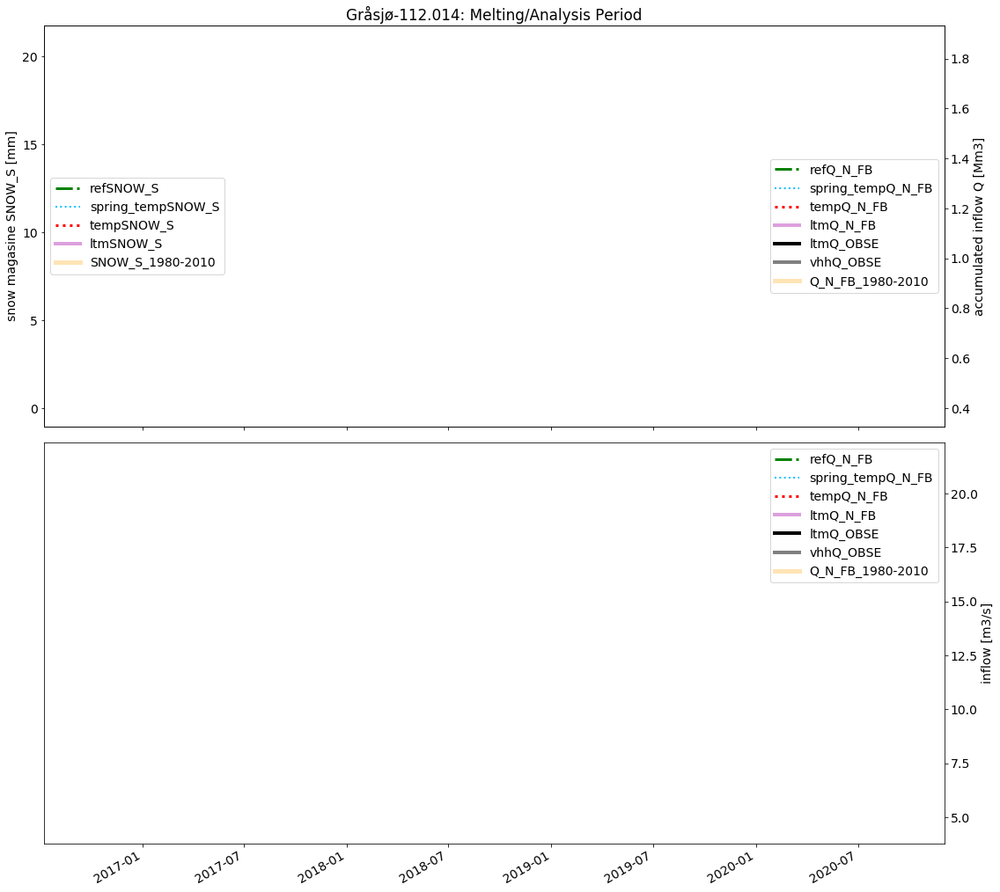

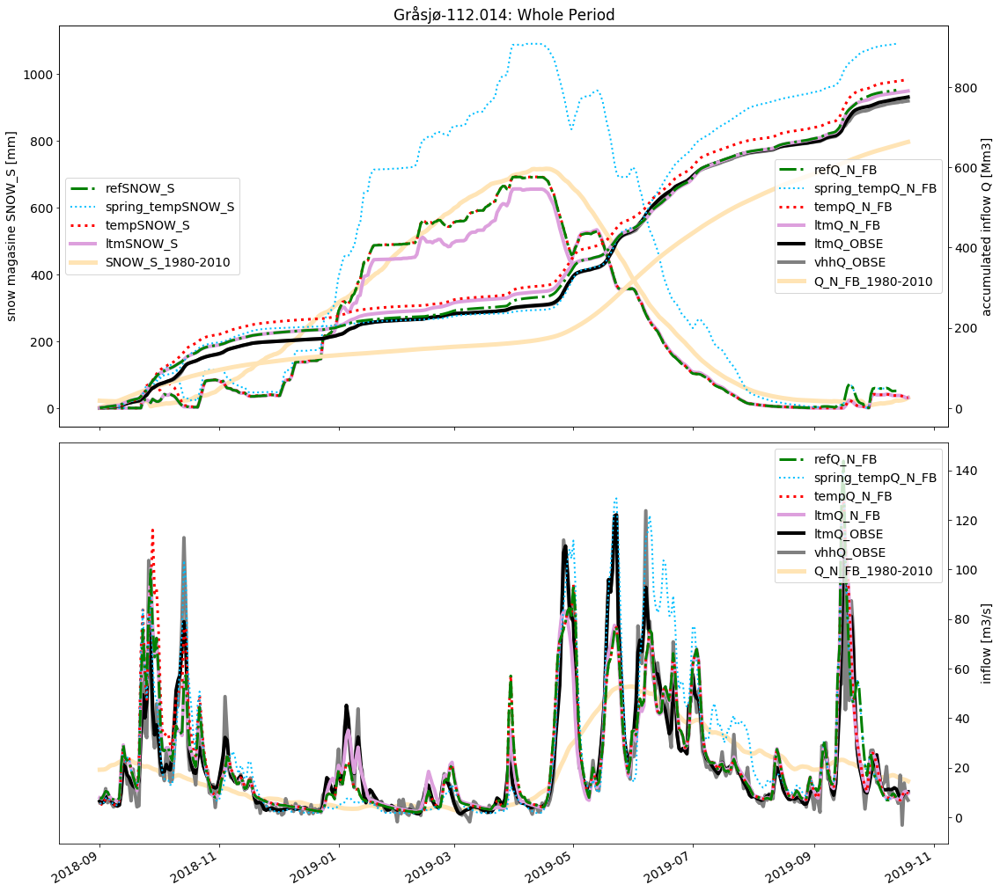




------------------------------------------------------------------------------------------------------------------------
                                                        Hugdal-122.017
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-26): Peak of snow magasine for ref inndatasett.
WARNING! Analysis end (2019-06-15): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Accumulated performance [percentage deviation]: ref: -4.53, spring_temp: -4.53, temp: -4.53, ltm: -4.02
Profile correlation performance [R2 value]: ref: 0.81, spring_temp: 0.81, temp: 0.81, ltm: 0.93


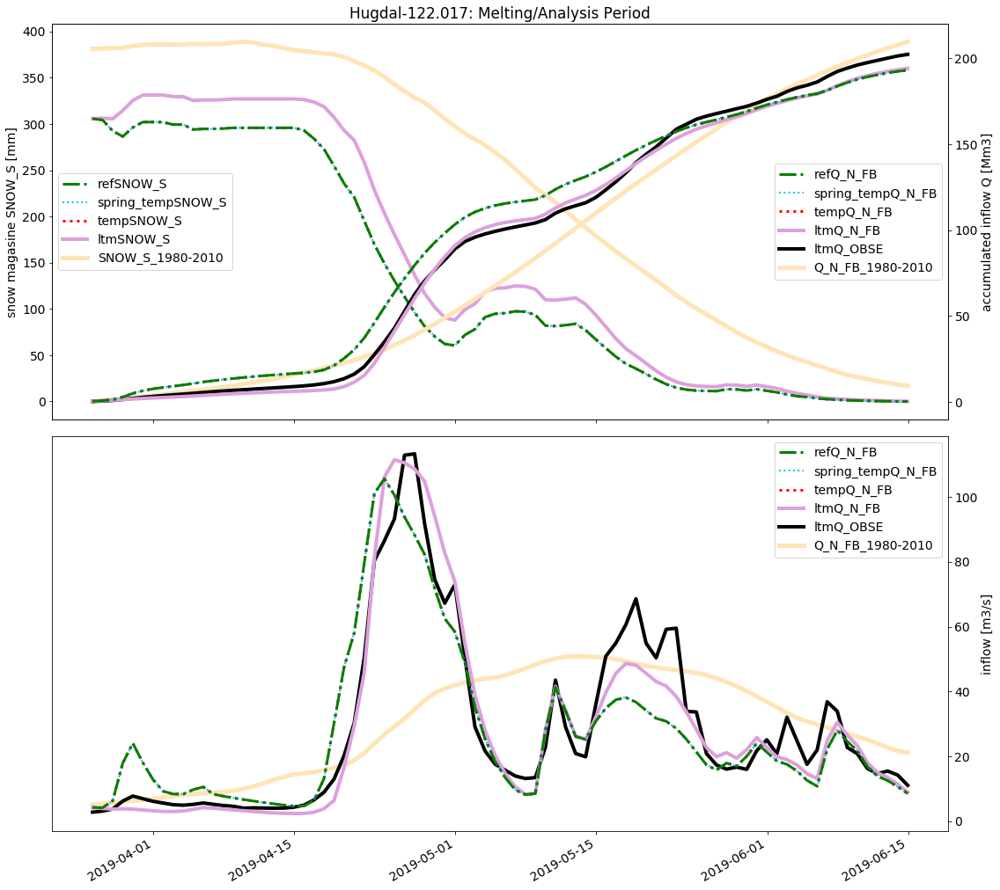

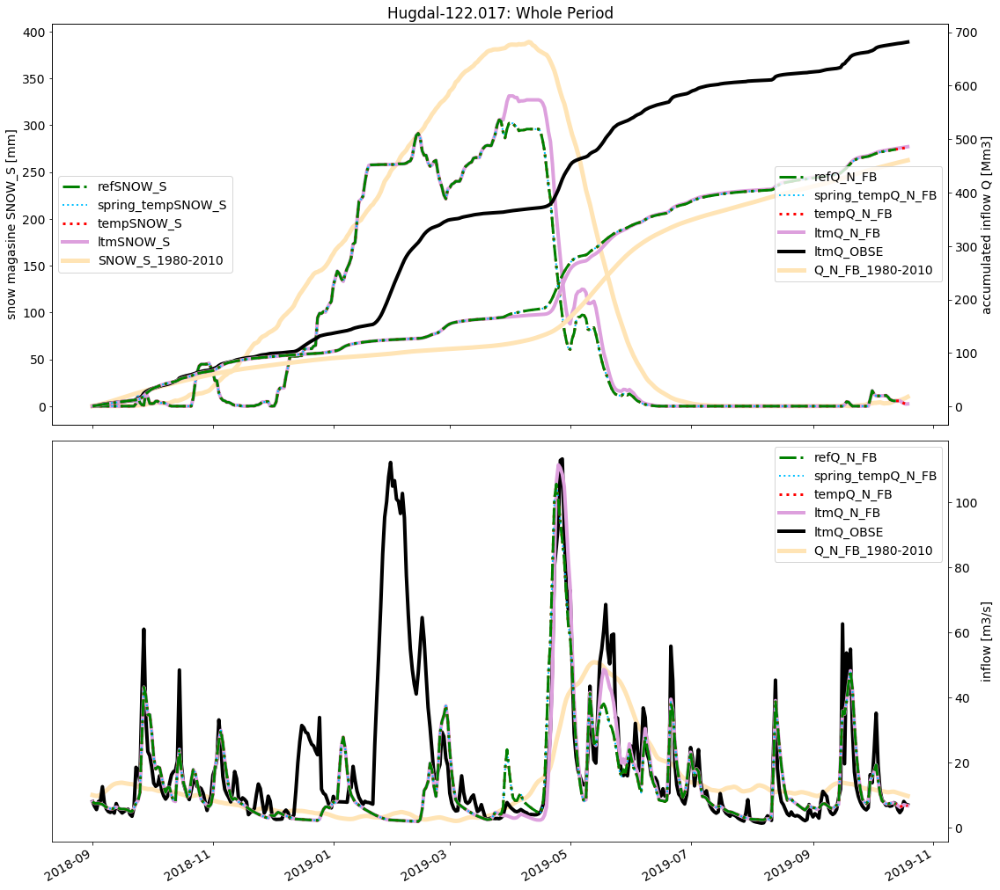




------------------------------------------------------------------------------------------------------------------------
                                                        Høggås-124.002
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-31): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-07-15): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Accumulated performance [percentage deviation]: ref: 26.59, spring_temp: 26.59, temp: 6.62, ltm: 3.72
Profile correlation performance [R2 value]: ref: 0.30, spring_temp: 0.30, temp: 0.75, ltm: 0.80


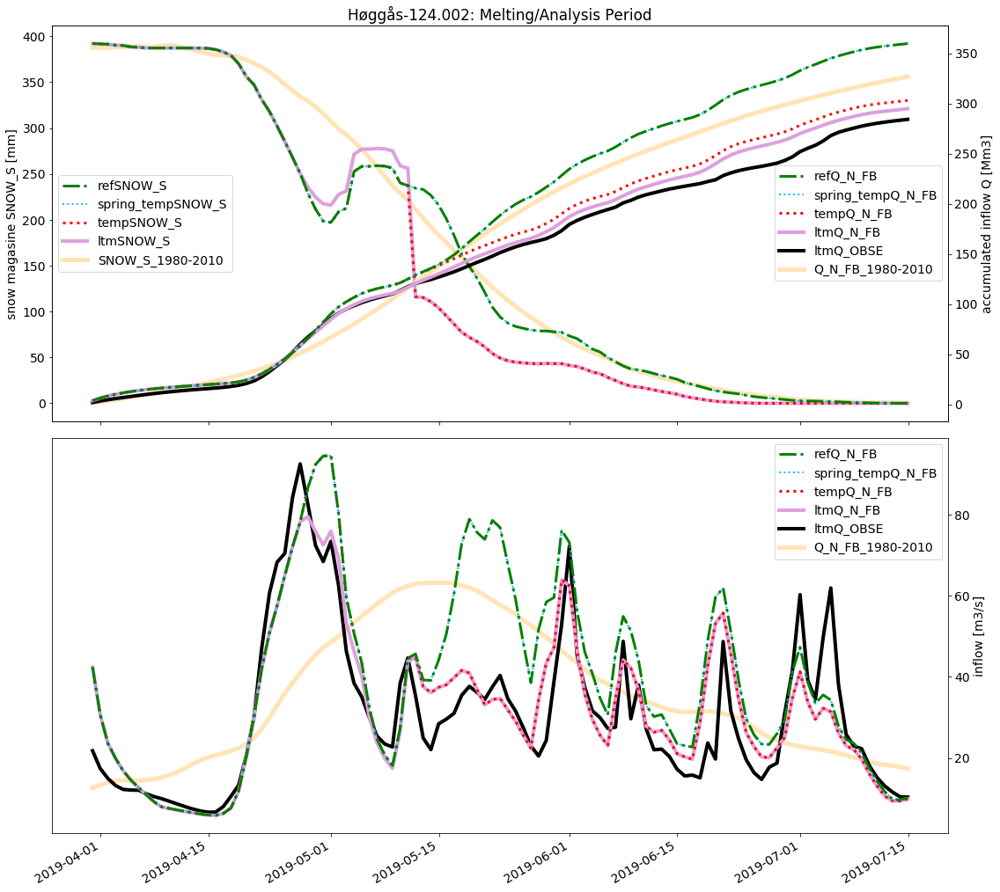

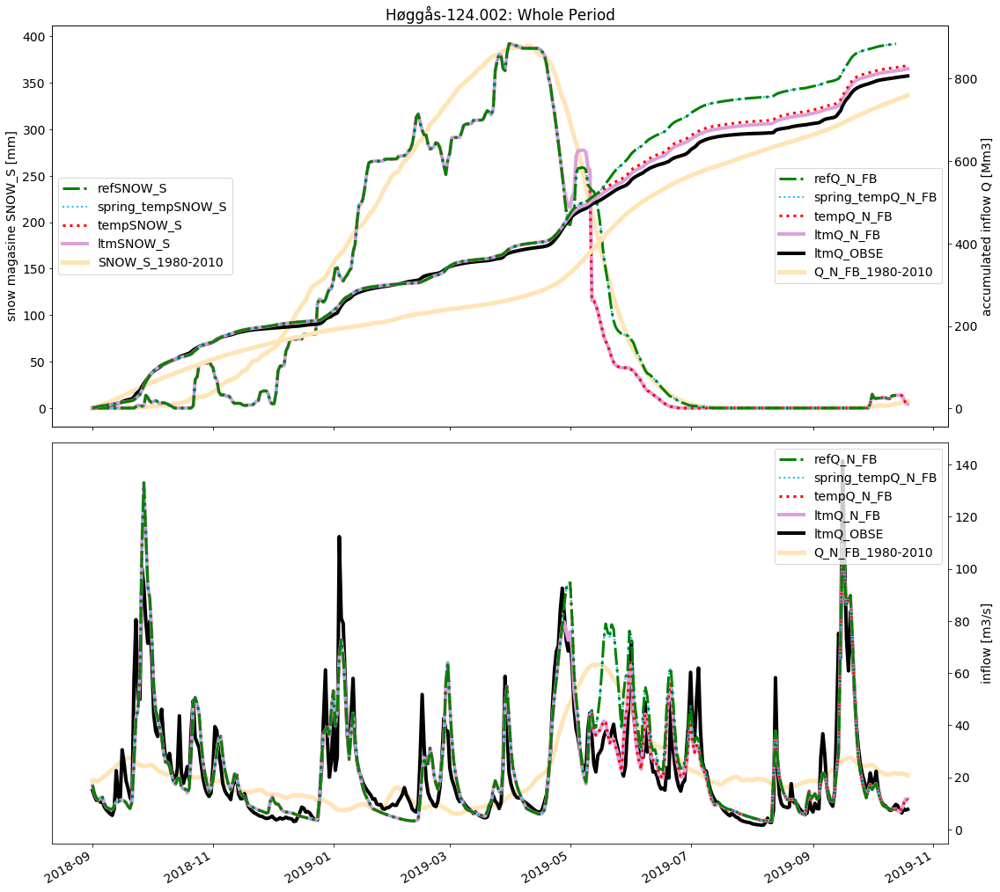




------------------------------------------------------------------------------------------------------------------------
                                                        Lillebu-122.014
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-26): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-07-05): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Accumulated performance [percentage deviation]: ref: 1.75, spring_temp: 1.75, temp: 1.75, ltm: -5.29
Profile correlation performance [R2 value]: ref: 0.83, spring_temp: 0.83, temp: 0.83, ltm: 0.86


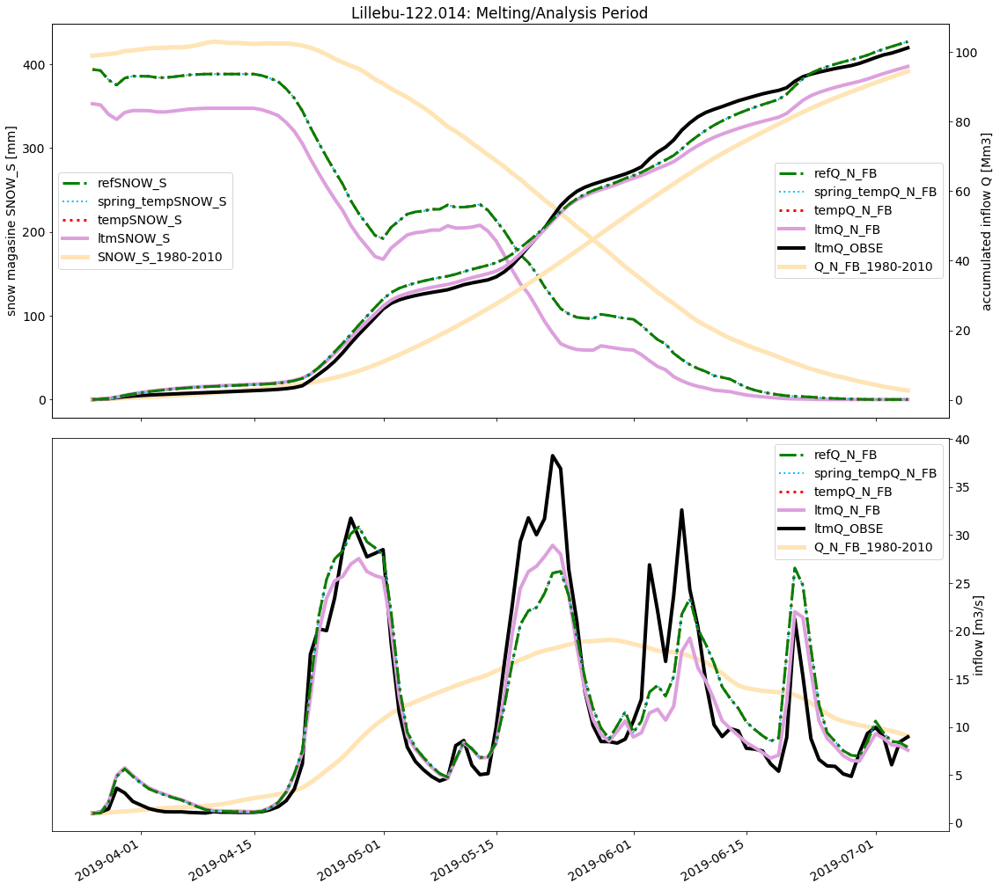

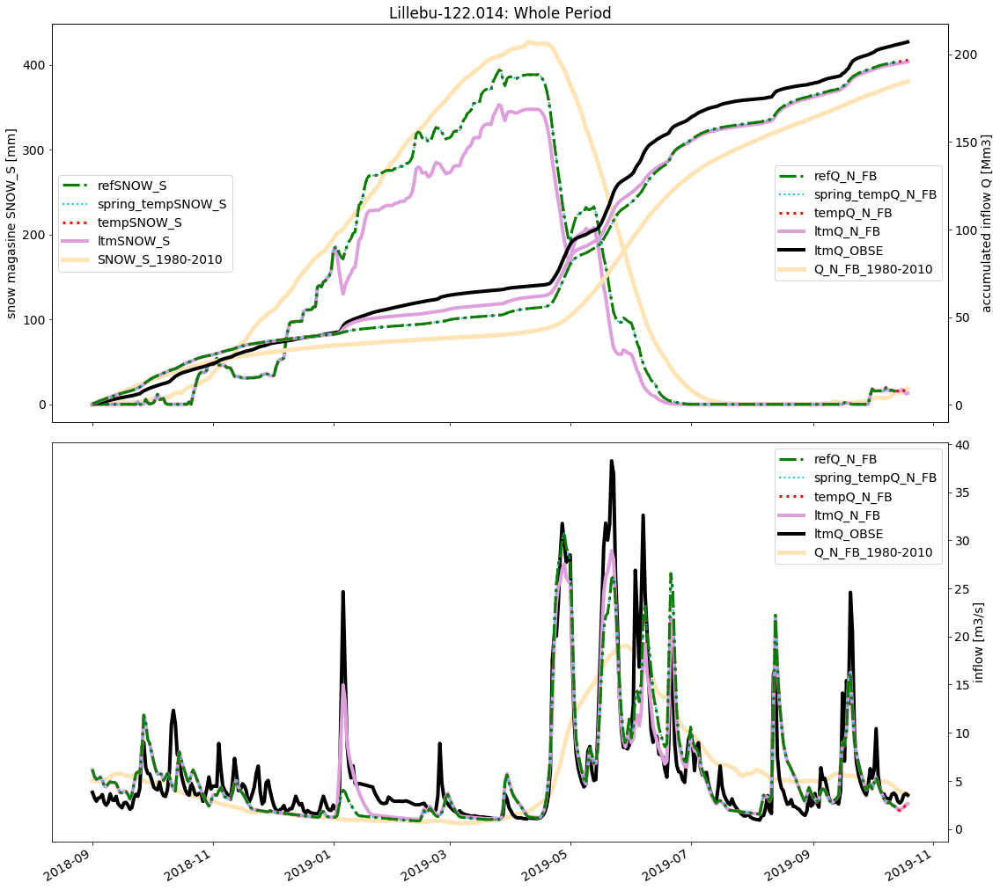




------------------------------------------------------------------------------------------------------------------------
                                                        Nea-123.998
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-04-07): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-08-18): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Accumulated performance [percentage deviation]: ref: -3.28, spring_temp: -3.28, temp: -3.28, ltm: 1.55
Profile correlation performance [R2 value]: ref: 0.81, spring_temp: 0.81, temp: 0.81, ltm: 0.91


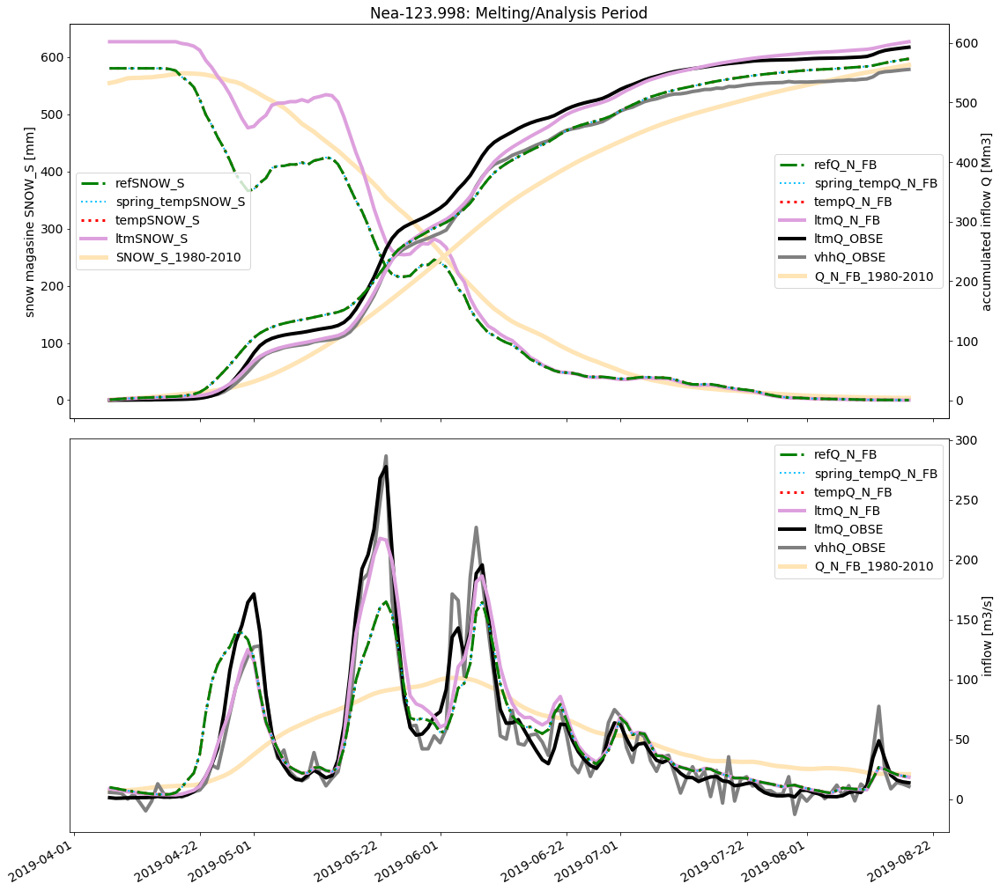

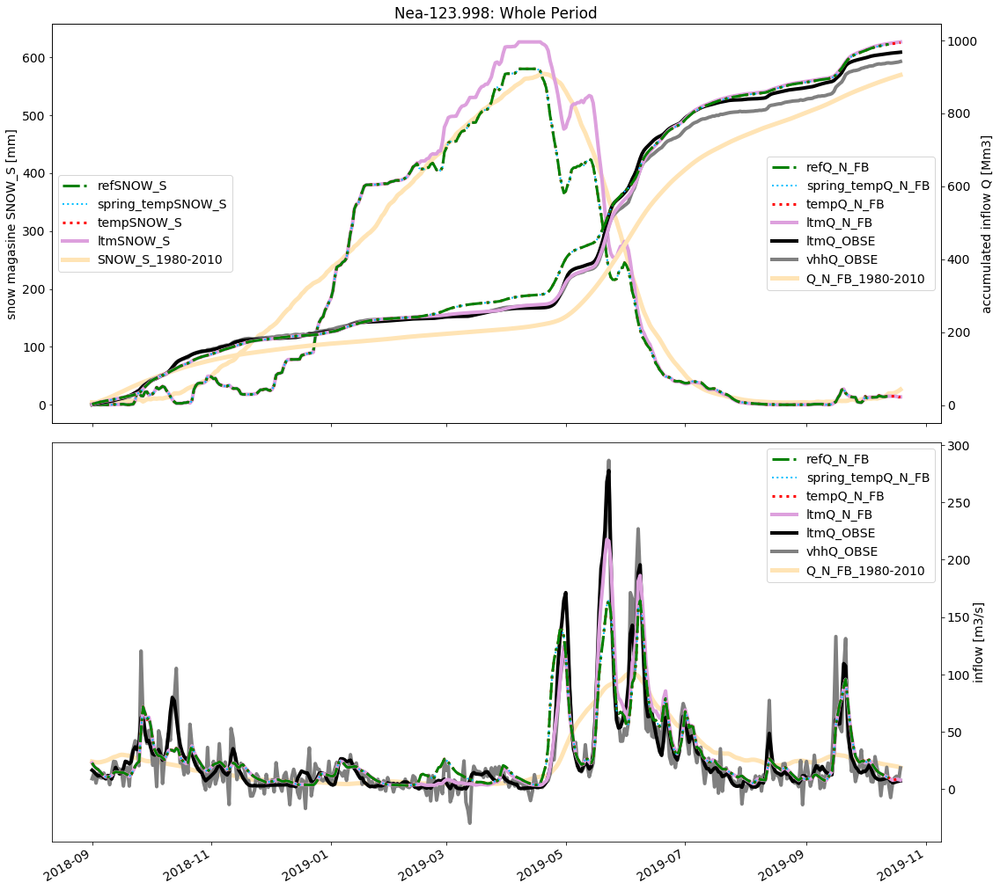




------------------------------------------------------------------------------------------------------------------------
                                                        Selb.lo-123.020
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-31): Peak of snow magasine for ref inndatasett.
Analysis end (2019-07-06): First day when the inflow models are close to Q_OBSE, one week after the snow magasine goes under 20 GWh SWE.

Accumulated performance [percentage deviation]: ref: 0.12, spring_temp: 0.12, temp: 0.12, ltm: 7.69
Profile correlation performance [R2 value]: ref: 0.71, spring_temp: 0.71, temp: 0.71, ltm: 0.88


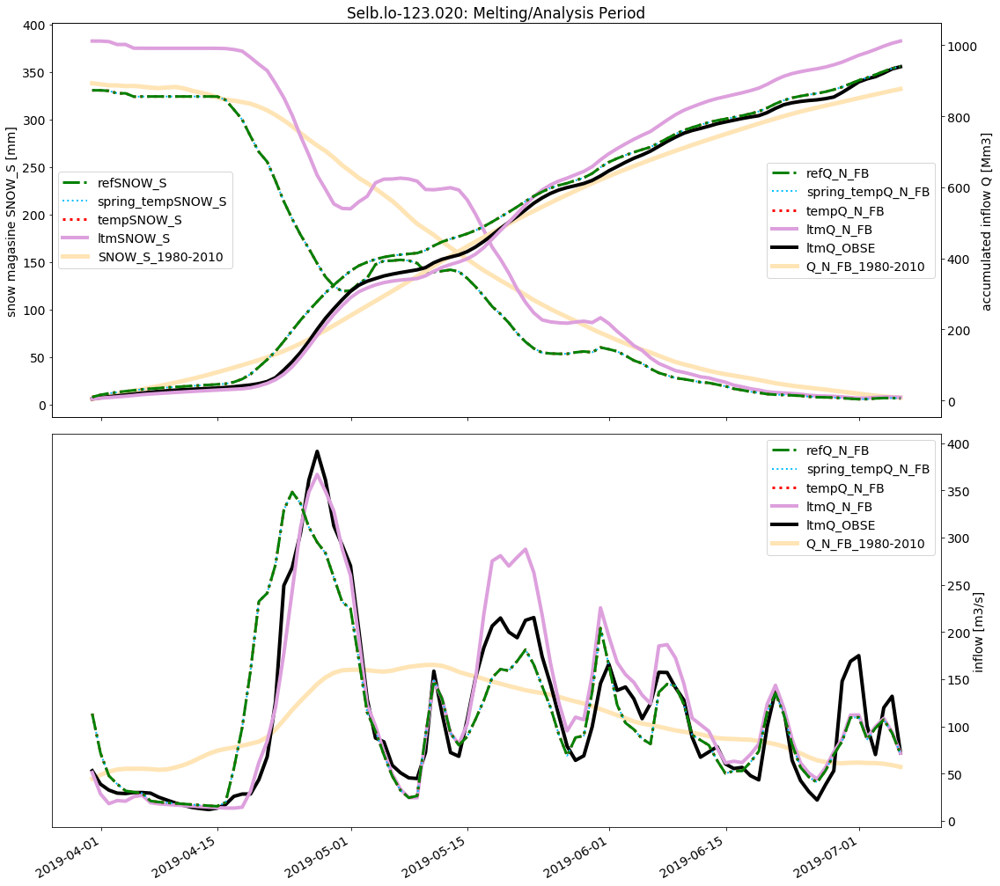

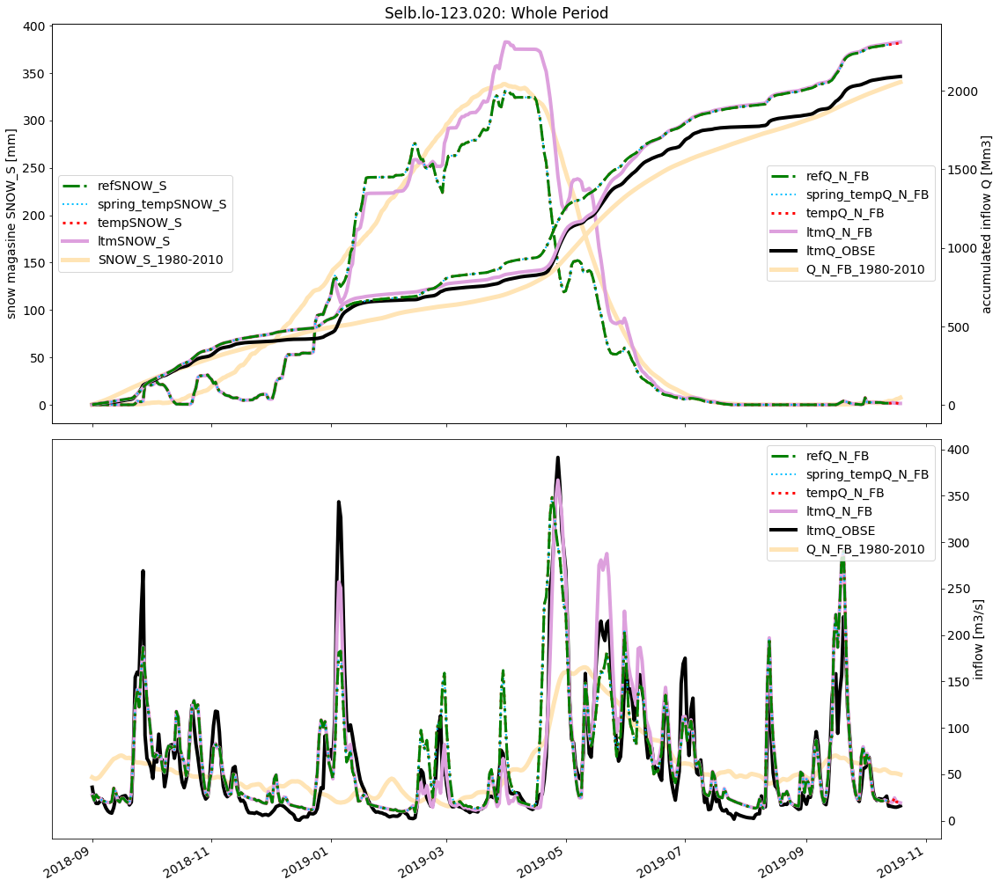




------------------------------------------------------------------------------------------------------------------------
                                                        Svorka-112.021
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-04-01): Peak of snow magasine for ref inndatasett.
Analysis end (2019-06-06): First day when the inflow models are close to Q_OBSE, one week after the snow magasine goes under 20 GWh SWE.

Accumulated performance [percentage deviation]: ref: 65.02, spring_temp: 65.02, temp: 65.02, ltm: 30.53
Profile correlation performance [R2 value]: ref: -0.38, spring_temp: -0.38, temp: -0.38, ltm: 0.56


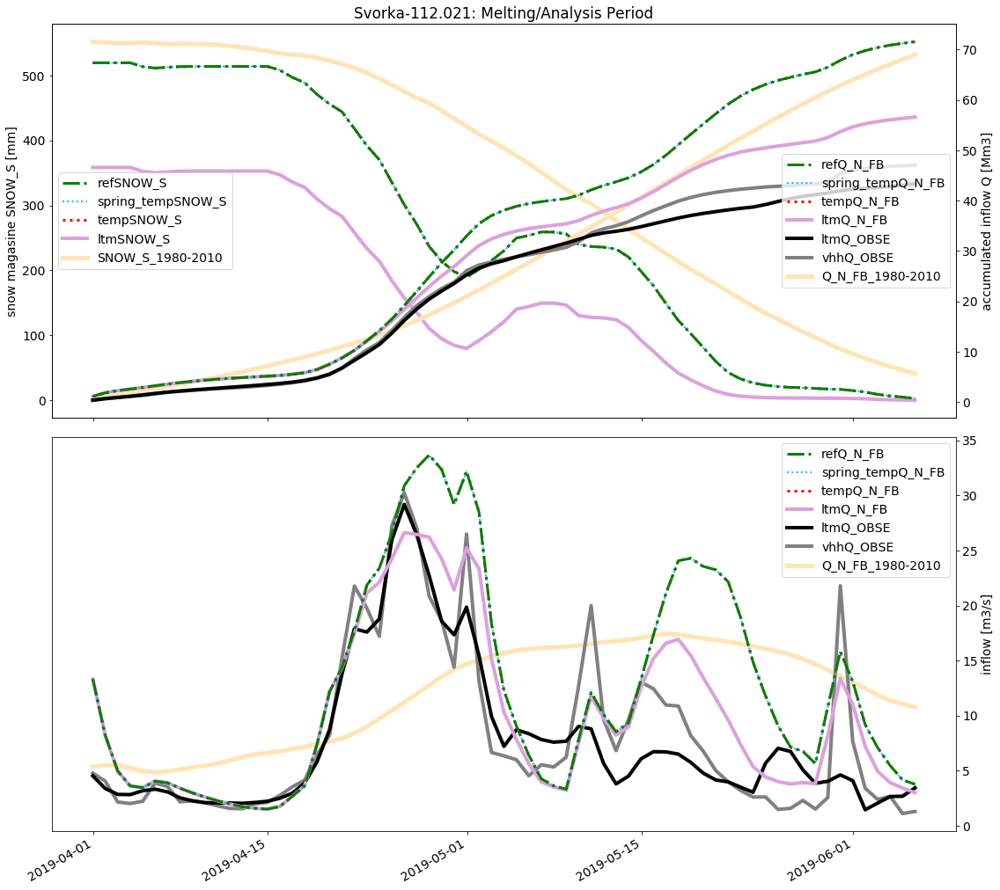

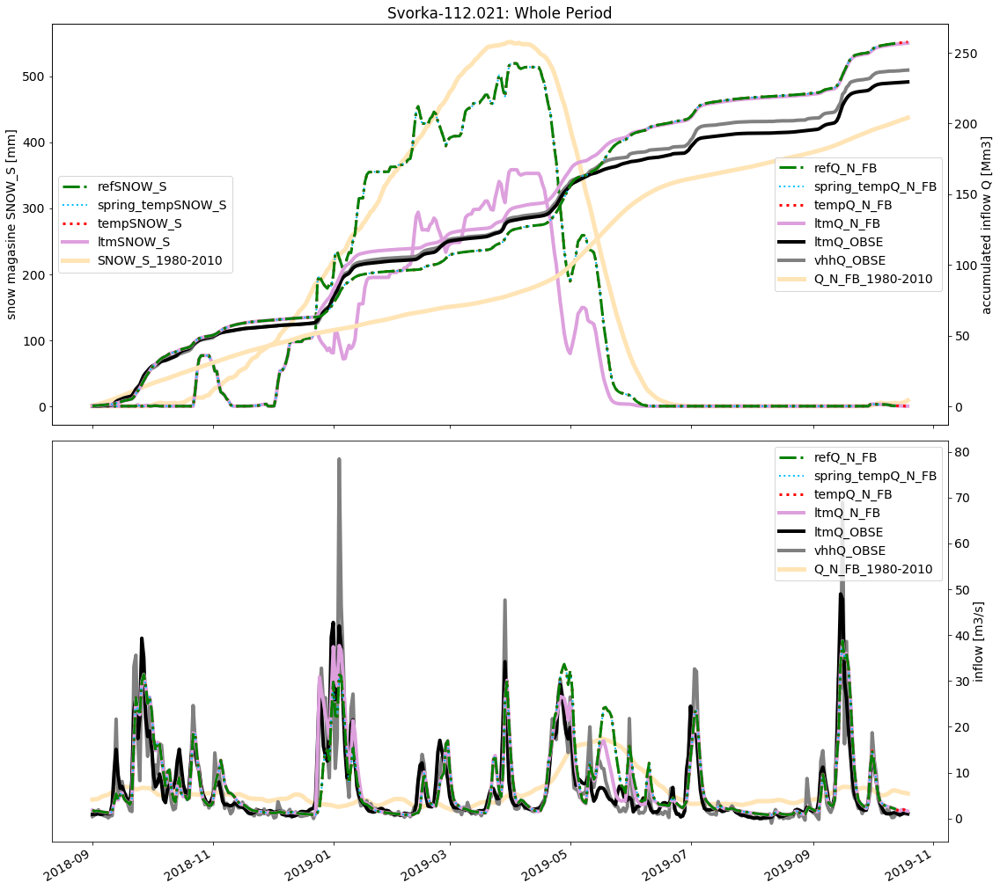




------------------------------------------------------------------------------------------------------------------------
                                                        Trollhe-112.015
------------------------------------------------------------------------------------------------------------------------
Analysis start (2018-09-22): Day befor spring snow adjustment.
Analysis end (2019-09-01): read from excel.

Comment from Excel file: "Lite magasin og laksevann. Strenge krav og lite handlingsrom. På trollheim/gråsjø i år (2019) ble snømagasinet justert drastisk ned rundt juni tider fordi modellen hadde alt for mye snø, og smelta da snø som ikke fantes lenger. Dette ble seende veldig fint ut, og vannverdien økte veldig siden dette gav dem mulighet til å regulere magasinene i stedenfor å kjøre fullt hele sommeren igjennom."


Accumulated performance [percentage deviation]: ref: 4.53, spring_temp: 10.08, temp: 5.73, ltm: 4.43
Profile correlation performance [R2 value]: ref: 0.8

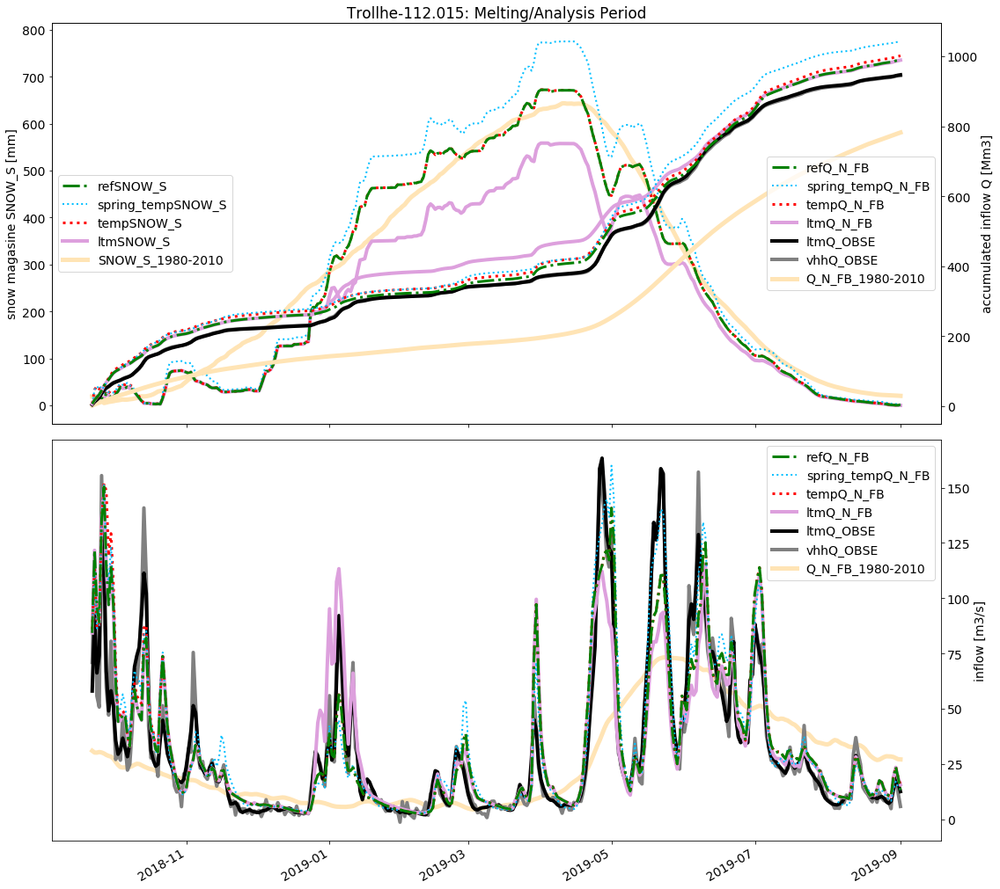

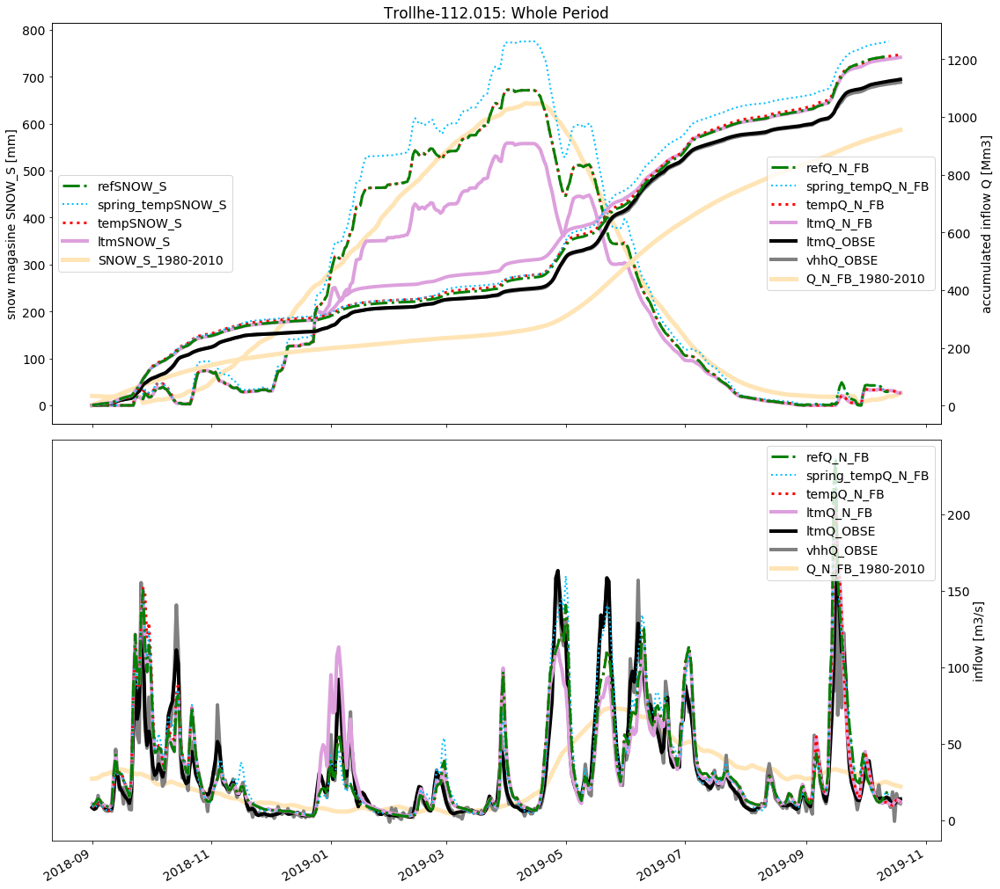




------------------------------------------------------------------------------------------------------------------------
                                                        Tya-123.999
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-01): read from excel.
Analysis end (2019-07-17): First day when the inflow models are close to Q_OBSE, one week after the snow magasine goes under 20 GWh SWE.

Accumulated performance [percentage deviation]: ref: -18.56, spring_temp: -6.26, temp: -6.26, ltm: -7.16
Profile correlation performance [R2 value]: ref: 0.65, spring_temp: 0.82, temp: 0.82, ltm: 0.91


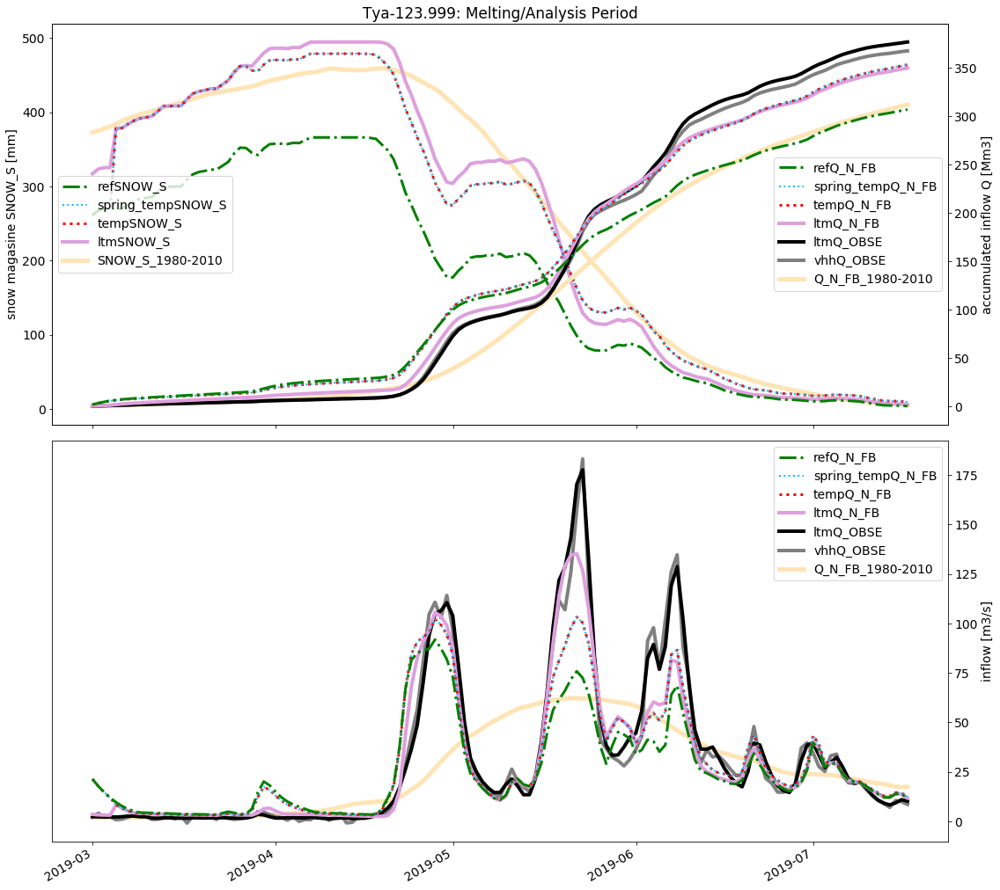

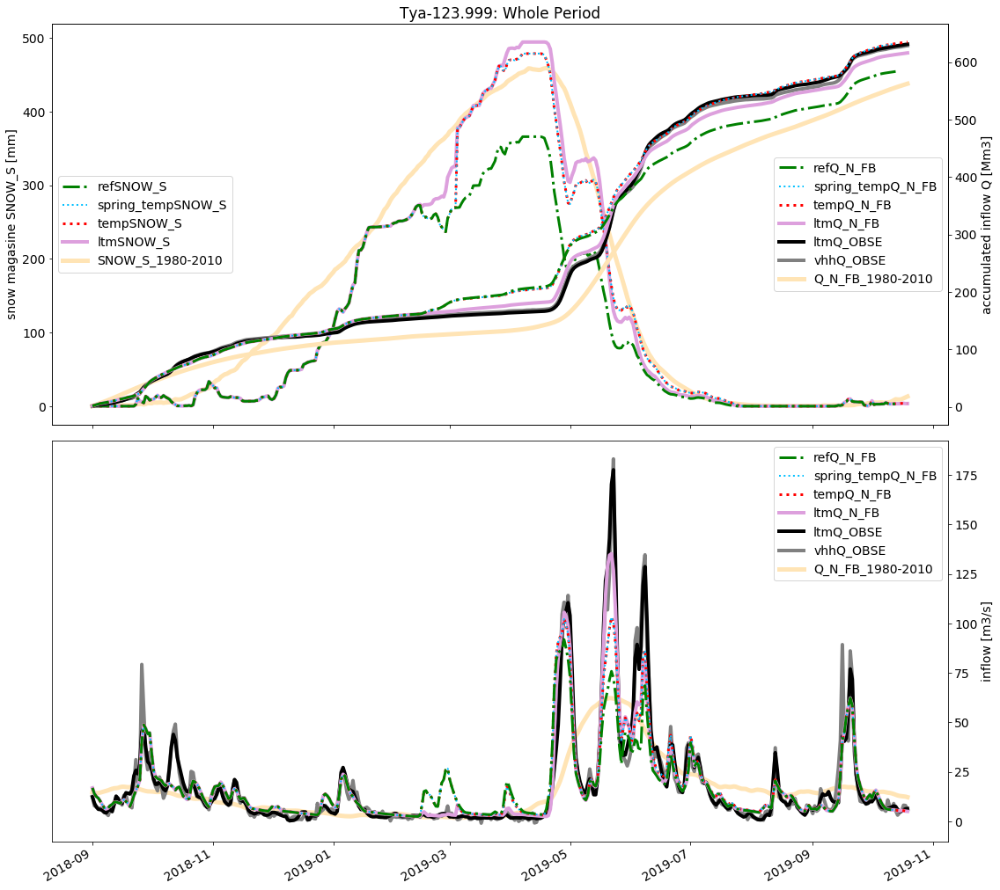




------------------------------------------------------------------------------------------------------------------------
                                                        Øye-098.002
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-04-01): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-08-30): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Accumulated performance [percentage deviation]: ref: -1.30, spring_temp: -1.30, temp: -1.30, ltm: -1.30
Profile correlation performance [R2 value]: ref: 0.59, spring_temp: 0.59, temp: 0.59, ltm: 0.59


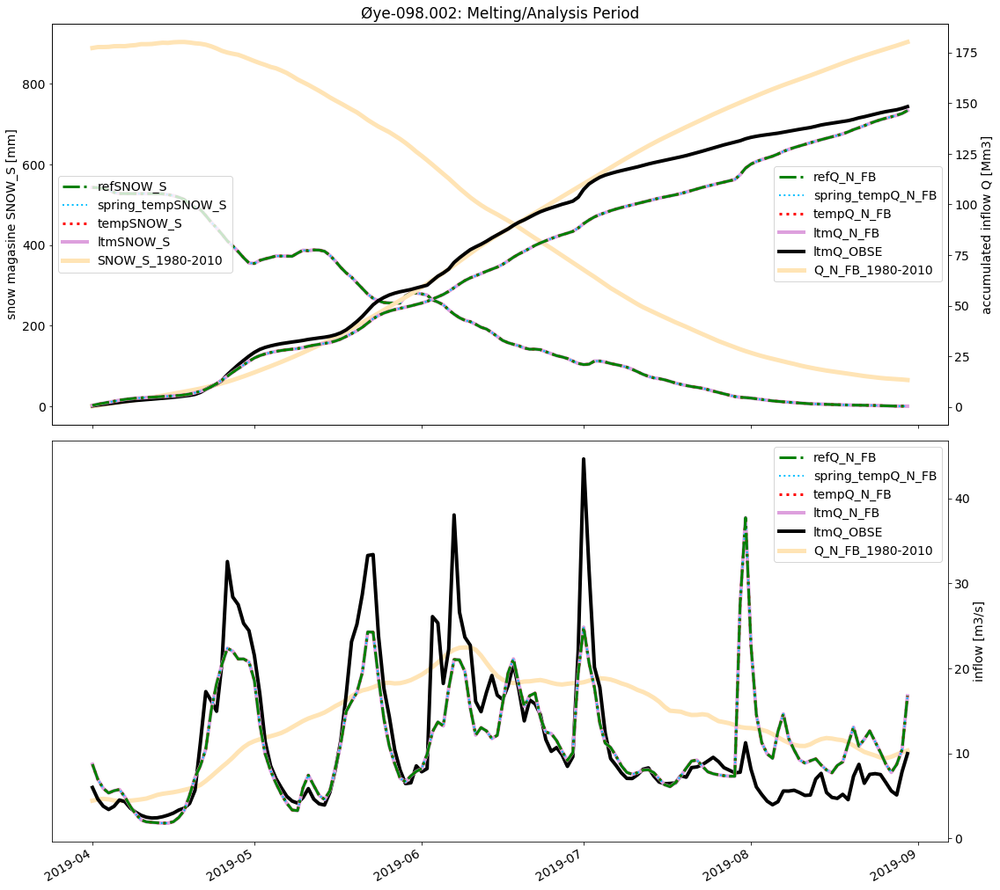

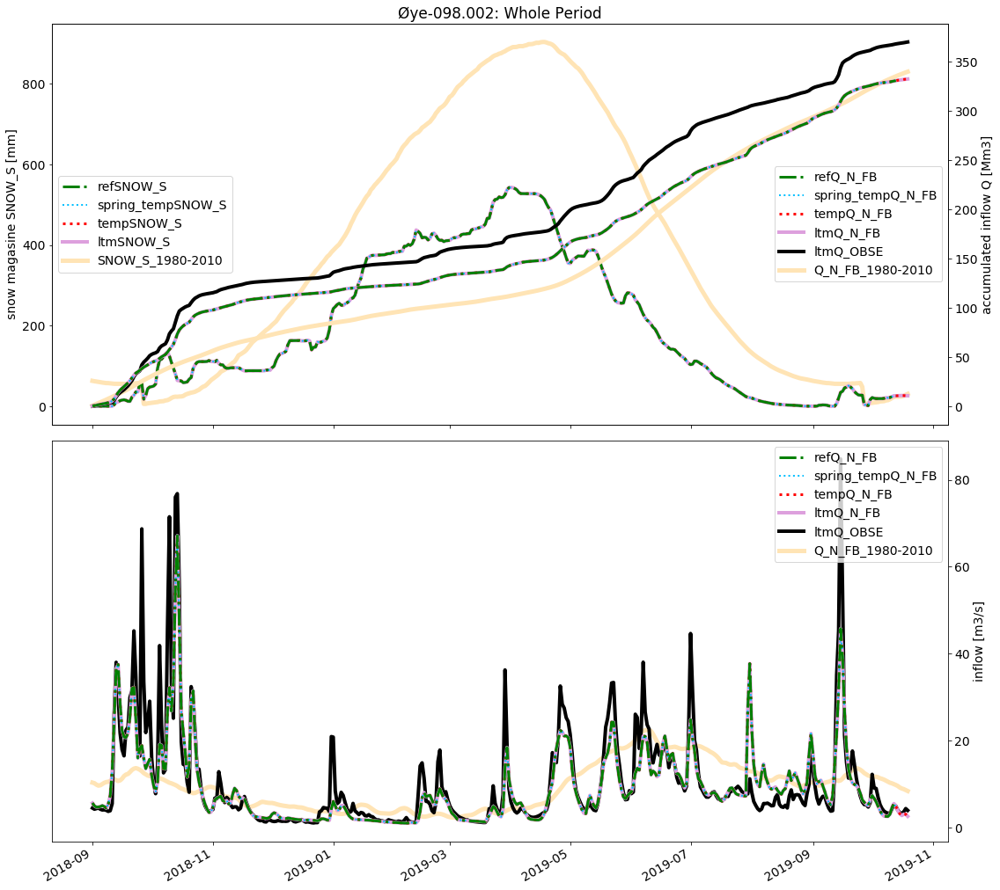




------------------------------------------------------------------------------------------------------------------------
                                                        Åmot-121.020
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-31): Peak of snow magasine for ref inndatasett.
Analysis end (2019-06-17): read from excel.

Accumulated performance [percentage deviation]: ref: 34.47, spring_temp: 34.47, temp: 34.47, ltm: 21.24
Profile correlation performance [R2 value]: ref: 0.62, spring_temp: 0.62, temp: 0.62, ltm: 0.86


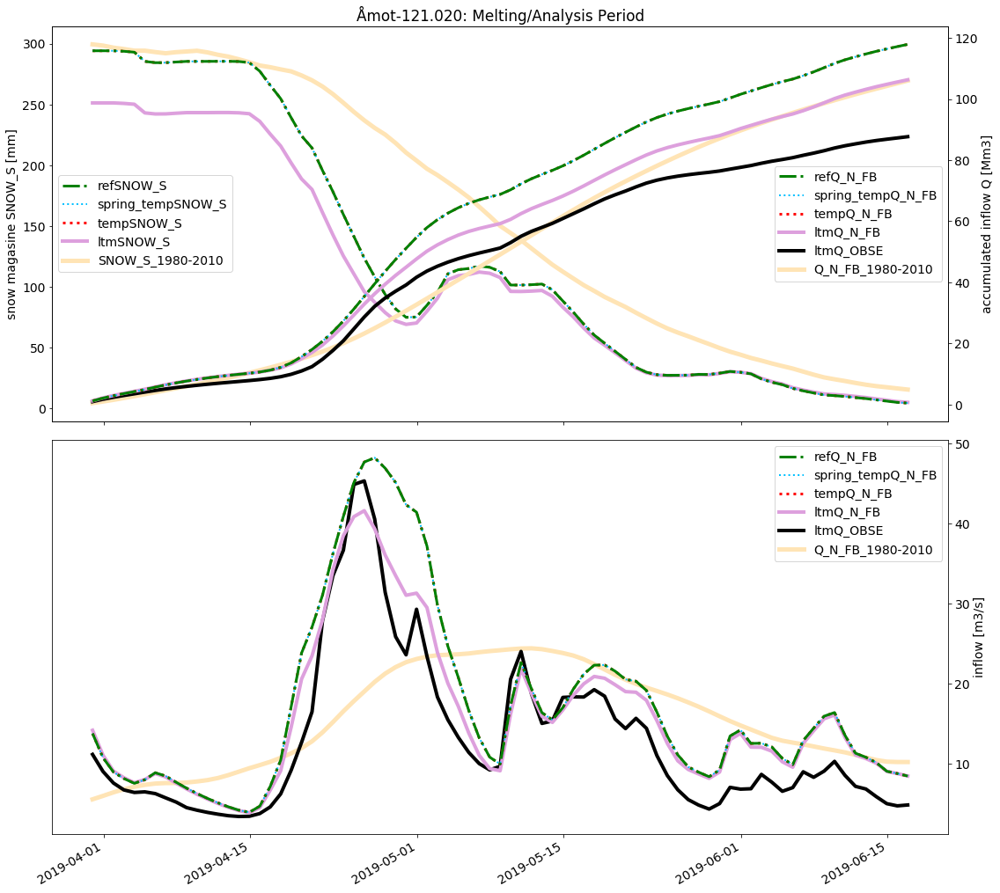

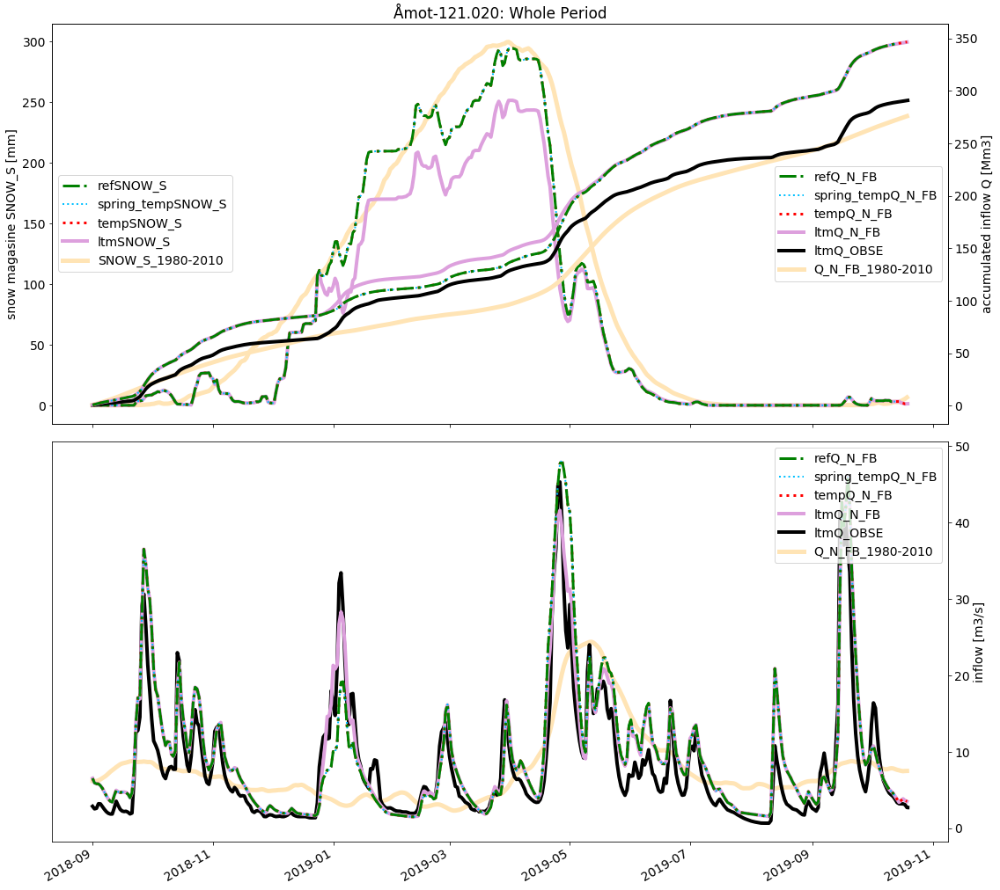




------------------------------------------------------------------------------------------------------------------------
                                                        Grytten-103.039
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-04-03): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-08-12): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Accumulated performance [percentage deviation]: ref: -24.33, spring_temp: -24.33, temp: -24.33, ltm: -17.65
Profile correlation performance [R2 value]: ref: 0.61, spring_temp: 0.61, temp: 0.61, ltm: 0.87


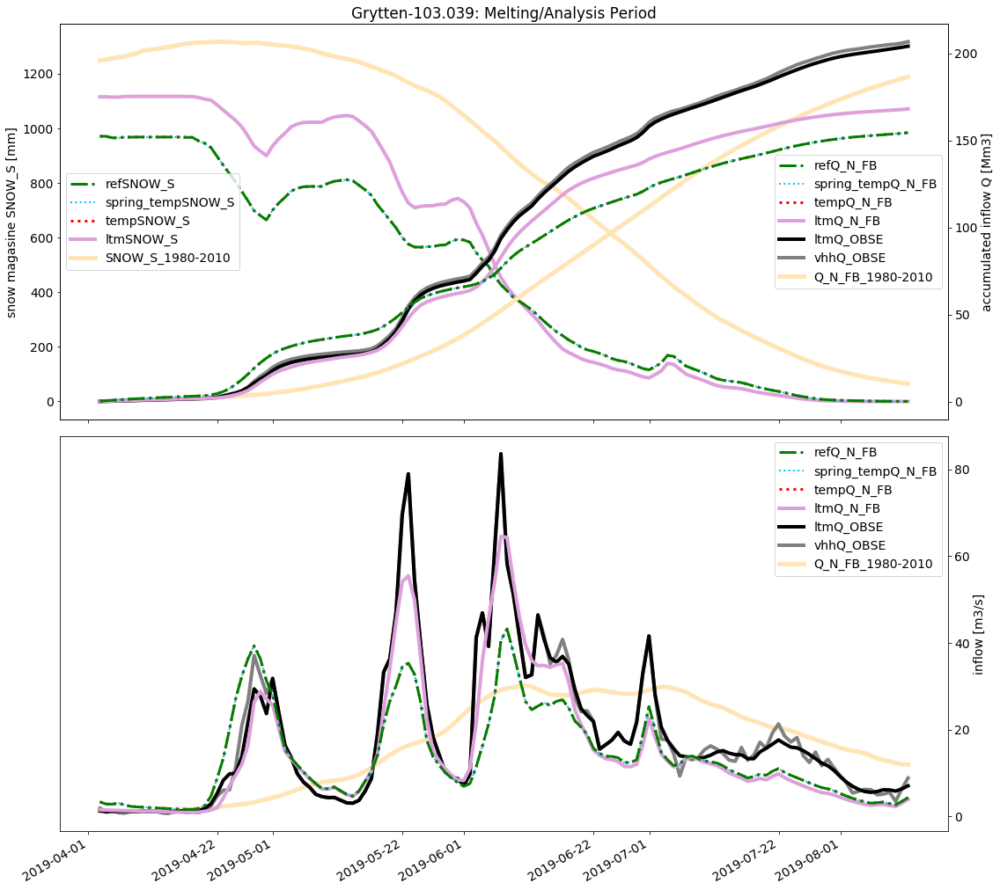

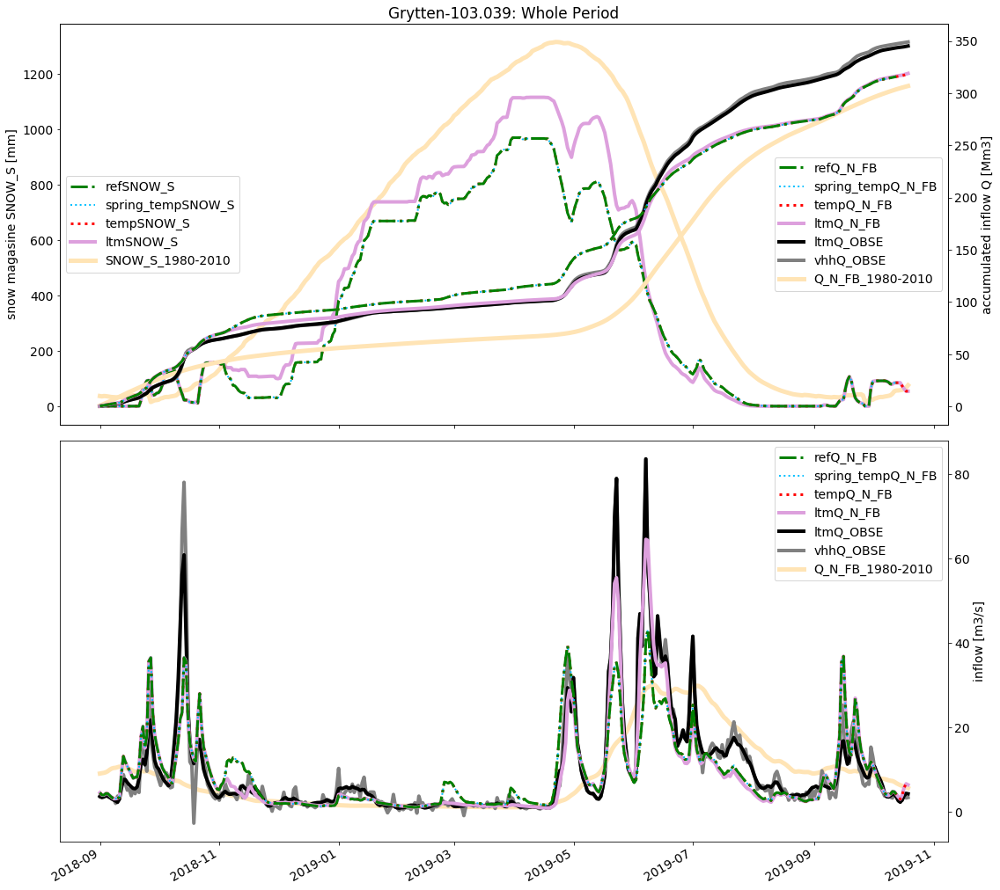




------------------------------------------------------------------------------------------------------------------------
                                                        Rinna-112.008
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-04-13): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-09-29): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Accumulated performance [percentage deviation]: ref: 22.08, spring_temp: 22.08, temp: 2.39, ltm: -2.35
Profile correlation performance [R2 value]: ref: 0.71, spring_temp: 0.71, temp: 0.83, ltm: 0.85


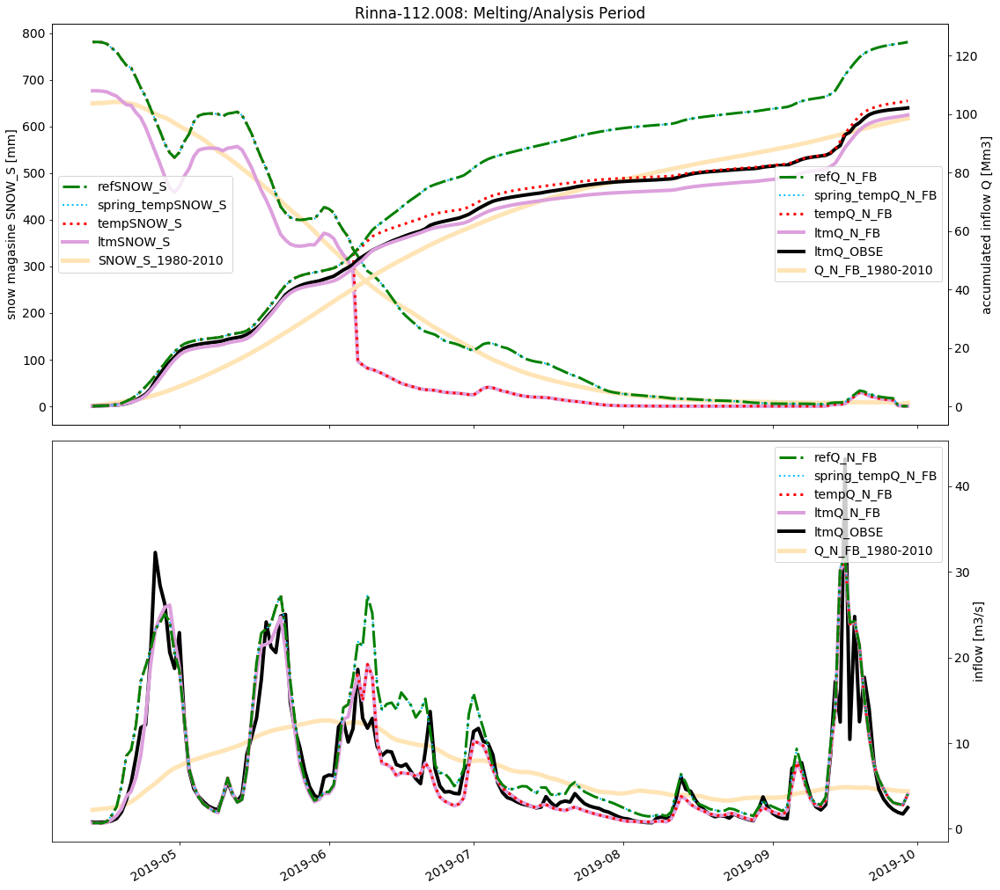

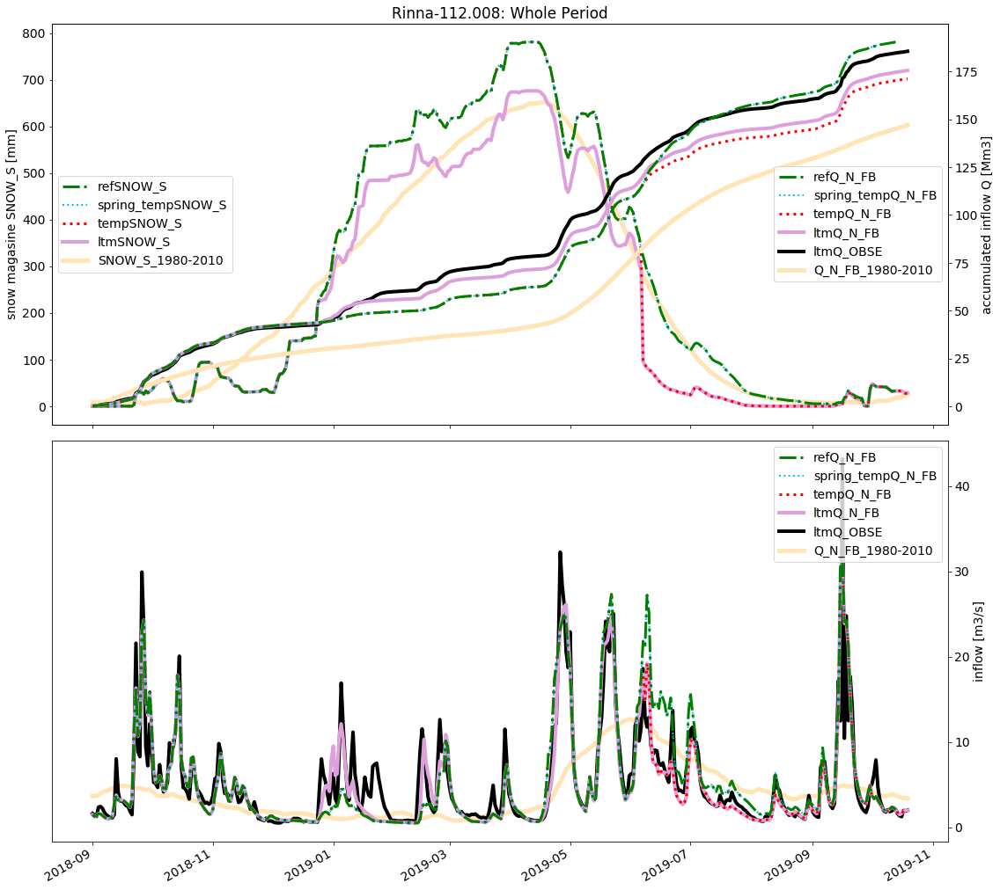




------------------------------------------------------------------------------------------------------------------------
                                                        Høy.K5A-079.014
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-01): read from excel.
Analysis end (2019-07-23): First day when the inflow models are close to Q_OBSE, one week after the snow magasine goes under 20 GWh SWE.

Accumulated performance [percentage deviation]: ref: -1.63, spring_temp: 7.55, temp: 7.55, ltm: 7.56
Profile correlation performance [R2 value]: ref: 0.81, spring_temp: 0.83, temp: 0.83, ltm: 0.83


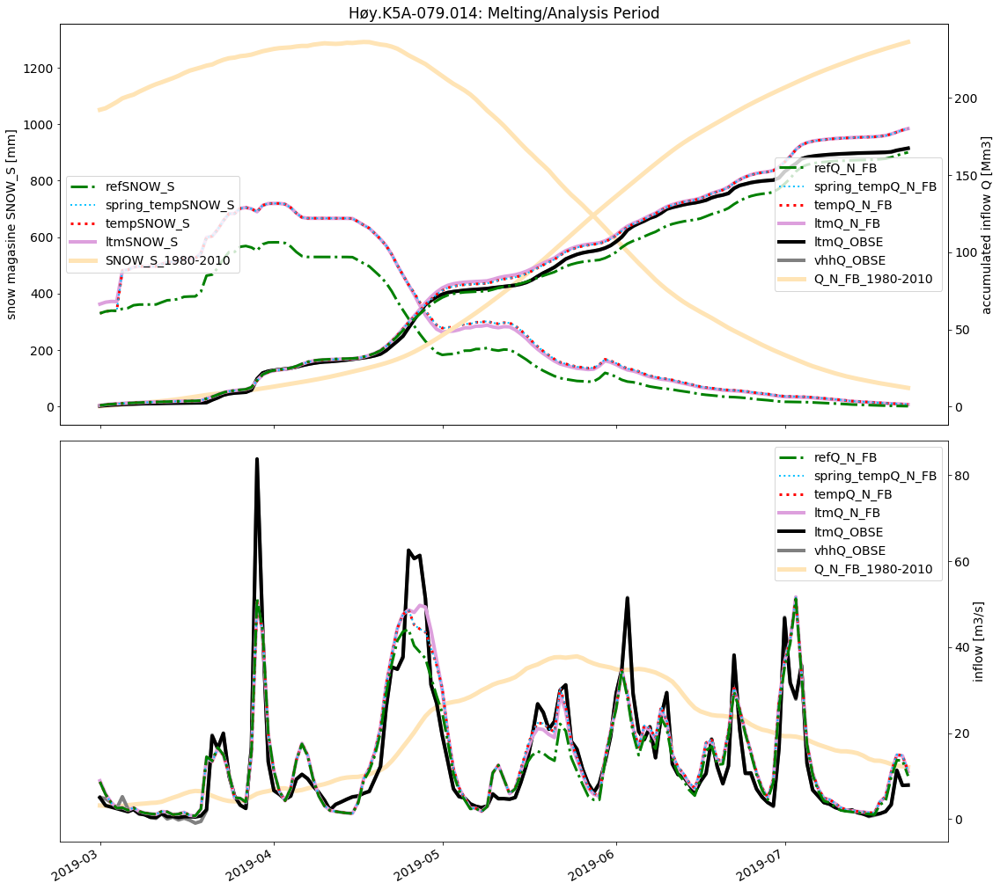

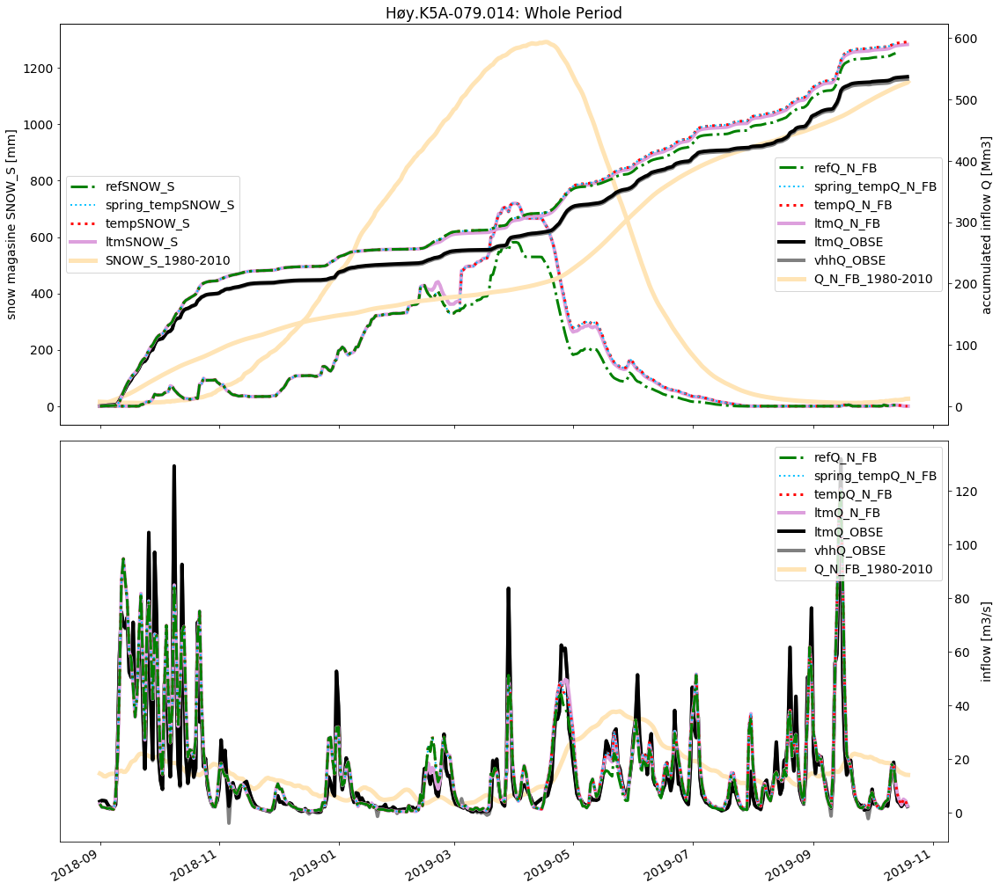

In [7]:
m.make_all(df_analysis_period, all_df, all_keys, start_info_list, end_info_list, sheet, vhhQ_OBSE_list, comments_list, excluded_list, file)